In [1]:
from src.datasets.dataset_creation import RepresentationDataset, RepresentationInMemoryDataset
from src.representations.data_representation import GraphRepresentation, Grid3DRepresentation, PointCloudRepresentation
from src.representations.featurizer import ResidueFeaturizer, AllAtomFeaturizer

Usage of RepresentationDataset and RepresentationInMemoryDataset is detailed in 00_dataset_creation.ipynb

# Featurizer

Featurizer defines the granularity of the representations. At the moment 2 Featurizer exists:

- ResidueFeaturizer: for residue level representations
- AllAtomFeaturizer: for atom level representations

For example, a residue level featurizer, using Alpha carbon as residue center and "one hot encoding" of the full sequence as features can be invoked this way:

In [2]:
full_feature_list = ["one hot", "Blossum", "isoelectric point", "hydrophobicity",
            "polarity", "dihedral", "volume", "secondary structure", "accessible surface"]
residue_center = "CA"
res_featurizer = ResidueFeaturizer(residue_center=residue_center, feature_list=full_feature_list)

At the moment there is no ways to configure the all atom featurizer. All atom featurizer can be defined as follows:

In [3]:
atom_feat = AllAtomFeaturizer()

# Representations

In [4]:
structure = "data/DistanceGraph/8zr6.pdb"

## Graph

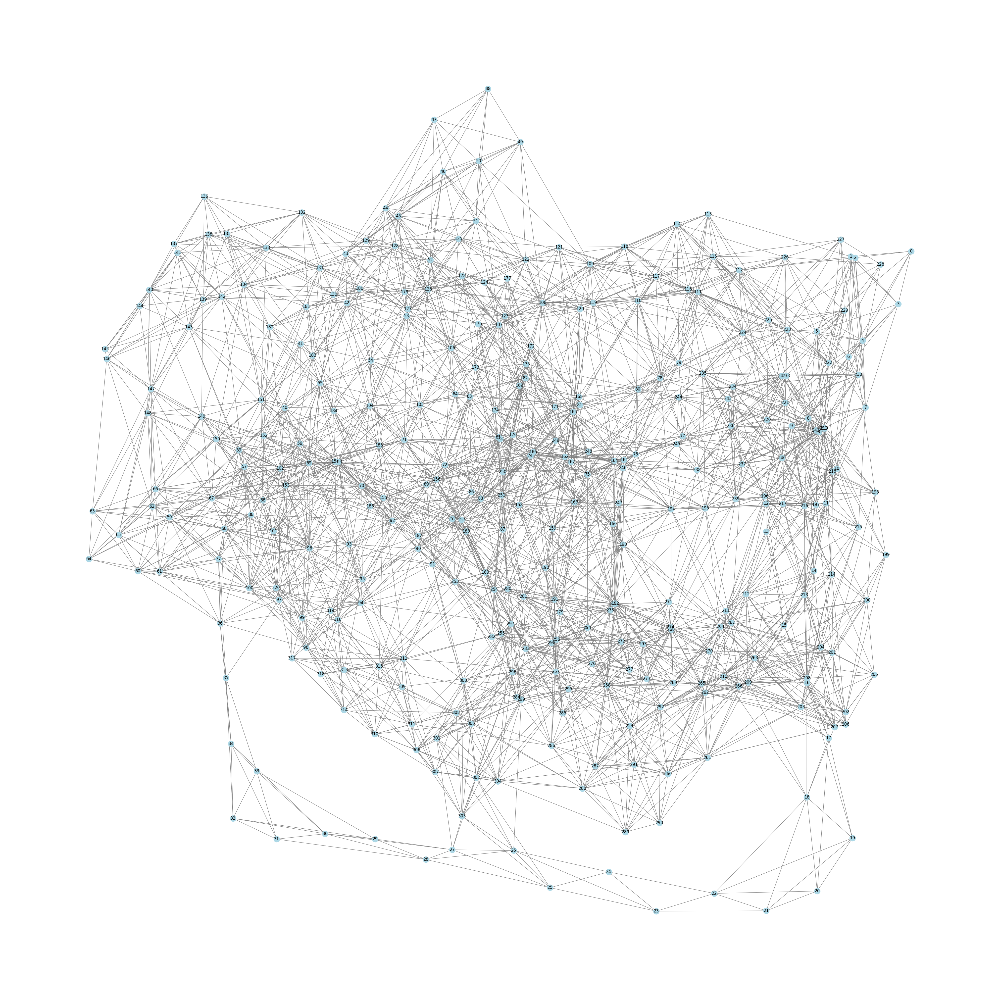

In [5]:
res_graph = GraphRepresentation(structure=structure, featurizer=res_featurizer, label = 10)
res_graph.visualize_representation()

In [6]:
res_graph.representation.x

tensor([[50.0610, 46.1290, 65.7200,  ...,  0.0000,  1.0000,  1.3475],
        [46.2540, 45.8230, 65.6130,  ...,  0.0000,  0.0000,  0.6698],
        [46.5350, 45.7600, 61.8100,  ...,  0.0000,  0.0000,  0.7354],
        ...,
        [12.8540, 21.7680, 85.9100,  ...,  0.0000,  0.0000,  1.1255],
        [13.4700, 25.4270, 86.8010,  ...,  0.0000,  0.0000,  0.3386],
        [10.0330, 26.7460, 85.7940,  ...,  0.0000,  1.0000,  0.7925]])

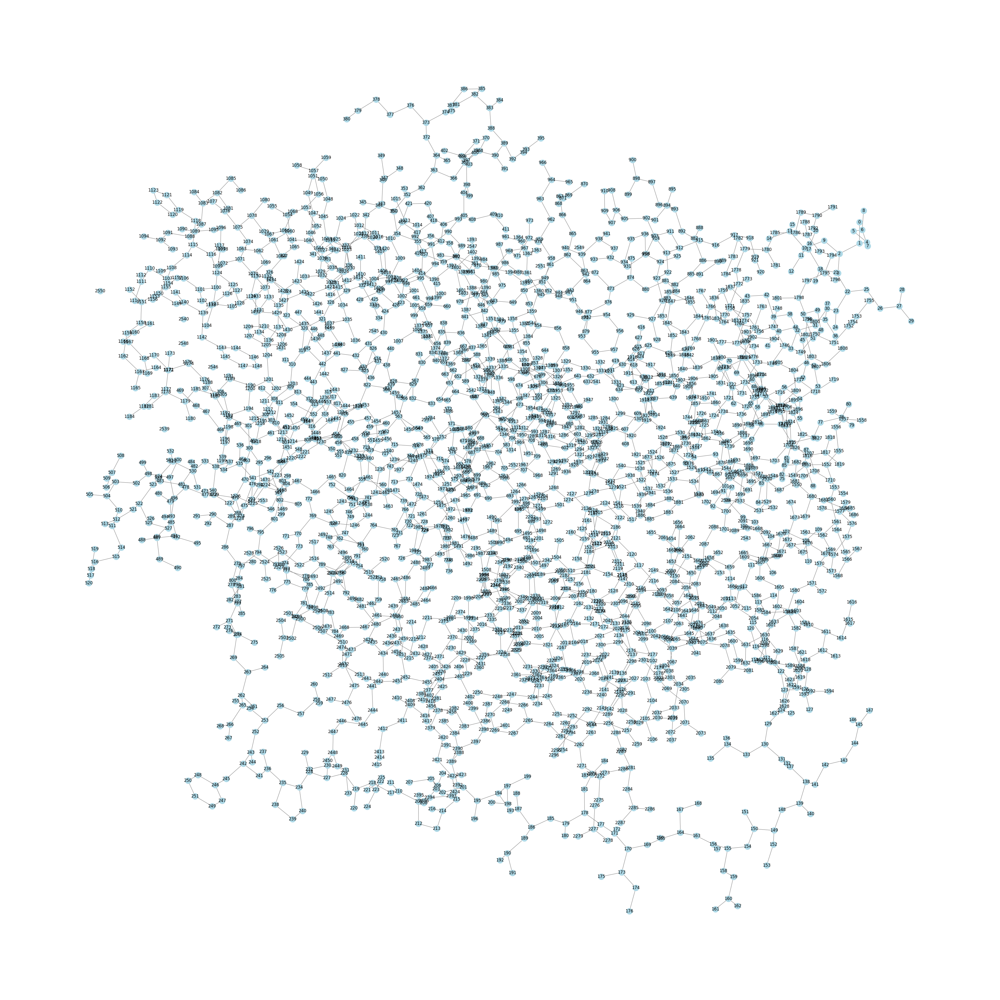

In [7]:
atom_graph = GraphRepresentation(structure=structure, featurizer=atom_feat, cutoff_distance=2, label = 10)
atom_graph.visualize_representation()

In [8]:
atom_graph.representation.x

tensor([[50.0730, 47.4580, 65.1010, 14.0070],
        [50.0610, 46.1290, 65.7200, 12.0110],
        [48.6770, 45.4800, 65.6840, 12.0110],
        ...,
        [27.9430, 44.7020, 65.9200, 15.9990],
        [26.0660, 32.1990, 99.0260, 15.9990],
        [ 8.6670, 29.9770, 91.7890, 15.9990]])

## 3D Grid

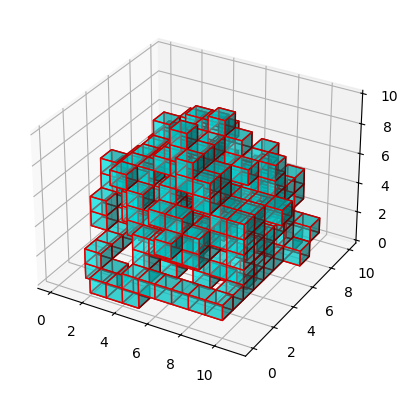

In [9]:
res_grid = Grid3DRepresentation(structure=structure, featurizer=res_featurizer, voxel_size=5, label = 12)
res_grid.visualize_representation()

In [10]:
res_grid.representation

Data(x=[11, 10, 10, 75], y=12)

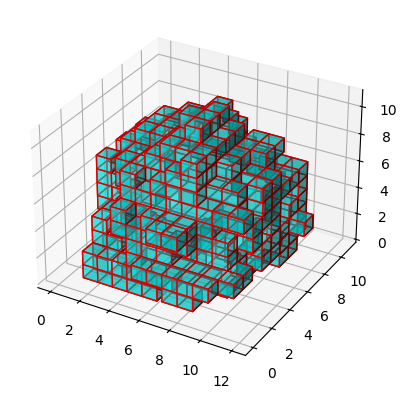

In [11]:
atom_grid = Grid3DRepresentation(structure=structure, featurizer=atom_feat, voxel_size=5, label = 12)
atom_grid.visualize_representation()

In [12]:
atom_grid.representation

Data(x=[12, 11, 11, 4], y=12)

## Point Cloud

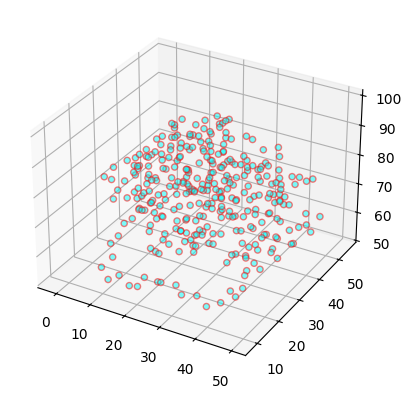

In [13]:
res_point = PointCloudRepresentation(structure=structure, featurizer=res_featurizer, label = 12)
res_point.visualize_representation()

In [14]:
res_point.representation

Data(x=[321, 72], y=12, pos=[321, 3])

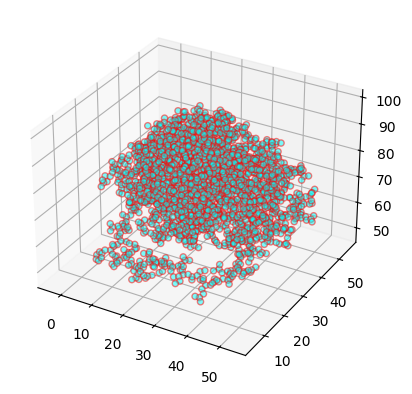

In [15]:
atom_point = PointCloudRepresentation(structure=structure, featurizer=atom_feat, label = 12)
atom_point.visualize_representation()

In [16]:
atom_point.representation

Data(x=[2554, 1], y=12, pos=[2554, 3])